## business.json: Contains business data including location data, attributes, and categories.

In [1]:
import json
import csv
import pandas as pd 
import numpy as np #linear algebra
import gc #garbage collection - keep track of objects in memory
import re #regular expressions
import os #operating system 

#plotting
import matplotlib.pyplot as plt 
import seaborn as sns

#map
import folium

def ReadJSONtoDF(file_name): #read JSON file and convert to pandas DF
    data_file = open(file_name,encoding="utf8")
    data_list = []
    for line in data_file:
        data_list.append(json.loads(line))
    DataDF = pd.DataFrame(data_list)
    data_file.close()
    return DataDF

def null(dataframe): #generate null count summary by descending number
    null_df = pd.DataFrame(dataframe.isnull().sum()).reset_index() #count null values
    null_df = null_df.rename(columns={'index':'colnames', 0:'null'})
    null_df['null_ratio%'] = round(null_df['null']/dataframe.shape[0]*100, 4) #calculate null ratio
    null_df = null_df.sort_values(by='null_ratio%', ascending=False)
    return null_df

pd.set_option('display.max_columns', None)

In [2]:
business_df = ReadJSONtoDF("yelp_academic_dataset_business.json")
business_df.head(5)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."


In [3]:
business_df.rename({"name": "business_name"}, axis = "columns", inplace = True) # rename name column to be more explicit

In [4]:
# show number of rows & columns
business_df.shape

(150346, 14)

#### Data Types

In [5]:
# show info of df
business_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150346 entries, 0 to 150345
Data columns (total 14 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   business_id    150346 non-null  object 
 1   business_name  150346 non-null  object 
 2   address        150346 non-null  object 
 3   city           150346 non-null  object 
 4   state          150346 non-null  object 
 5   postal_code    150346 non-null  object 
 6   latitude       150346 non-null  float64
 7   longitude      150346 non-null  float64
 8   stars          150346 non-null  float64
 9   review_count   150346 non-null  int64  
 10  is_open        150346 non-null  int64  
 11  attributes     136602 non-null  object 
 12  categories     150243 non-null  object 
 13  hours          127123 non-null  object 
dtypes: float64(3), int64(2), object(9)
memory usage: 16.1+ MB


#### Missing Values

In [6]:
null(business_df)

,colnames,null,null_ratio%
13,hours,23223,15.4464
11,attributes,13744,9.1416
12,categories,103,0.0685
0,business_id,0,0.0000
1,business_name,0,0.0000
2,address,0,0.0000
3,city,0,0.0000
4,state,0,0.0000
5,postal_code,0,0.0000
6,latitude,0,0.0000


#### Descriptive Statistics

In [7]:
business_df.describe().applymap(lambda x: f"{x:0.2f}")

,latitude,longitude,stars,review_count,is_open
count,150346.00,150346.00,150346.00,150346.00,150346.00
mean,36.67,-89.36,3.60,44.87,0.80
std,5.87,14.92,0.97,121.12,0.40
min,27.56,-120.10,1.00,5.00,0.00
25%,32.19,-90.36,3.00,8.00,1.00
50%,38.78,-86.12,3.50,15.00,1.00
75%,39.95,-75.42,4.50,37.00,1.00
max,53.68,-73.20,5.00,7568.00,1.00


#### State

In [8]:
state = business_df['state'].nunique() #number of unique states in the business dataset
print(f'Business dataset contains {state} states.')

Business dataset contains 27 states.


In [9]:
pd.unique(business_df['state']) # show unique states in the dataset

array(['CA', 'MO', 'AZ', 'PA', 'TN', 'FL', 'IN', 'LA', 'AB', 'NV', 'ID',
       'DE', 'IL', 'NJ', 'NC', 'CO', 'WA', 'HI', 'UT', 'TX', 'MT', 'MI',
       'SD', 'XMS', 'MA', 'VI', 'VT'], dtype=object)

In [10]:
business_df.state.value_counts().sort_values(ascending=False) #sort states by count

PA     34039
FL     26330
TN     12056
IN     11247
MO     10913
LA      9924
AZ      9912
NJ      8536
NV      7715
AB      5573
CA      5203
ID      4467
DE      2265
IL      2145
TX         4
CO         3
WA         2
HI         2
MA         2
NC         1
UT         1
MT         1
MI         1
SD         1
XMS        1
VI         1
VT         1
Name: state, dtype: int64

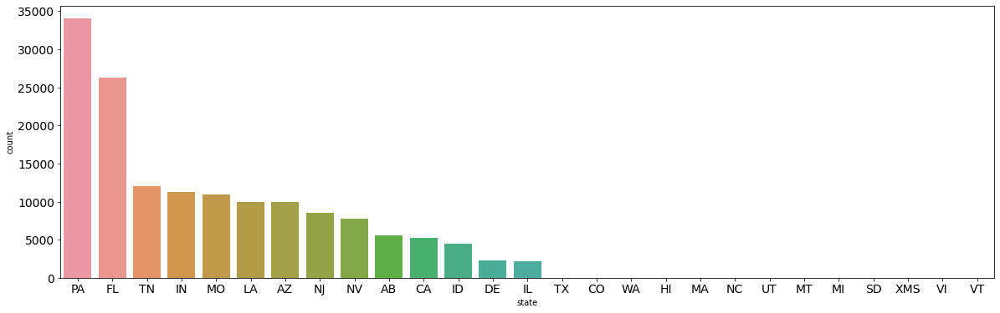

In [11]:
fig,ax= plt.subplots(figsize=(20,6))
sns.countplot(x='state', data=business_df, order = business_df['state'].value_counts().index) #graphs to sort state by count
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

PA & FL have the most number of businesses

In [12]:
## Number of cities in each state
state_city = business_df[['state', 'city']].drop_duplicates()
state_city.groupby('state')['city'].count().sort_values(ascending=False)

state
PA     434
NJ     239
FL     226
MO     117
TN      72
IL      60
IN      58
LA      53
CA      39
DE      35
AZ      34
NV      31
AB      24
ID      24
TX       4
CO       3
MA       2
HI       2
WA       2
MI       1
MT       1
NC       1
SD       1
UT       1
VI       1
VT       1
XMS      1
Name: city, dtype: int64

#### Business category

In [13]:
def category(dataframe):
    
    business_categories = dataframe['categories'].reset_index(drop=True)
    
    b_category_counts = {}
    
    # Iterate over reviews
    for row in range(business_categories.shape[0]):
        
        # Skip nones
        if business_categories[row] is None:
            continue
        
        # Cut whitespace
        categories = set(business_categories[row].split(", "))
        
        # Increment dictionary entries
        for cat in categories:
            if cat[0] == " ":
                cat = cat[1:]
            if cat in b_category_counts.keys():
                b_category_counts[cat] += 1
            else:
                b_category_counts[cat] = 1
                
    return b_category_counts

In [14]:
category_count = category(business_df)

In [15]:
print("Number of business categories in dataset: {}".format(len(category_count.keys())))

Number of business categories in dataset: 1311


In [16]:
sorted_vals = []
for key in category_count.keys():
    sorted_vals.append((key, category_count[key]))
sorted_vals = sorted(sorted_vals, key=lambda x: x[1], reverse = True)
sorted_df = pd.DataFrame(sorted_vals).rename(columns={0:'Category', 1:'Count'})

In [17]:
## Top 20 Categories
sorted_df.head(30)

,Category,Count
0,Restaurants,52268
1,Food,27781
2,Shopping,24395
3,Home Services,14356
4,Beauty & Spas,14292
5,Nightlife,12281
6,Health & Medical,11890
7,Local Services,11198
8,Bars,11065
9,Automotive,10773


In [18]:
### Bottom 20 Categories
sorted_df.tail(30)

,Category,Count
1281,Beach Bars,1
1282,DUI Schools,1
1283,Patent Law,1
1284,Housing Cooperatives,1
1285,Guamanian,1
1286,Donburi,1
1287,Tonkatsu,1
1288,Animal Assisted Therapy,1
1289,Pita,1
1290,Interlock Systems,1


#### Star Ratings

In [19]:
stars = pd.DataFrame(business_df['stars'].value_counts()).reset_index().rename(columns={'index':'stars', 'stars':'count'})
stars['%'] = round(stars['count'] / business_df.shape[0] * 100,  1)
stars

,stars,count,%
0,4.0,31125,20.7
1,4.5,27181,18.1
2,3.5,26519,17.6
3,3.0,18453,12.3
4,5.0,16307,10.8
5,2.5,14316,9.5
6,2.0,9527,6.3
7,1.5,4932,3.3
8,1.0,1986,1.3


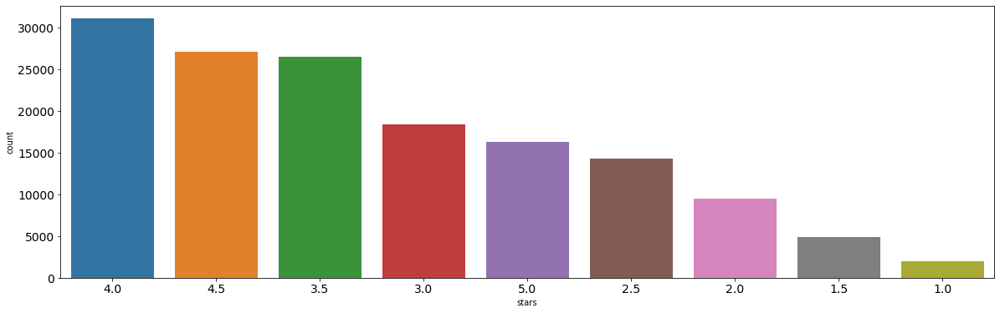

In [20]:
fig,ax= plt.subplots(figsize=(20,6))
sns.countplot(x='stars', data=business_df, order = business_df['stars'].value_counts().index) #graphs to sort stars by count
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.show()

#### Review Count

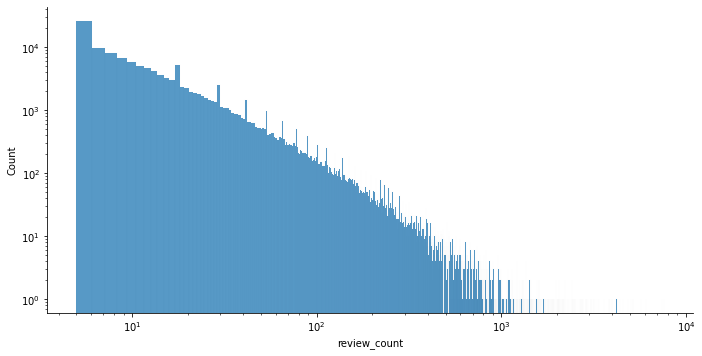

In [21]:
sns.displot(data=business_df, x='review_count', aspect=2)
plt.xscale('log')
plt.yscale('log')

In [22]:
#### Businesses with the highest review counts
business_df.sort_values(by=['review_count'], ascending=False)[:10]

,business_id,business_name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
113731,_ab50qdWOk0DdB6XOrBitw,Acme Oyster House,724 Iberville St,New Orleans,LA,70130,29.954273,-90.068965,4.0,7568,1,"{'RestaurantsTakeOut': 'True', 'Alcohol': ''fu...","Live/Raw Food, Seafood, Restaurants, Cajun/Creole","{'Monday': '11:0-22:0', 'Thursday': '11:0-22:0..."
112552,ac1AeYqs8Z4_e2X5M3if2A,Oceana Grill,739 Conti St,New Orleans,LA,70130,29.956231,-90.067563,4.0,7400,1,"{'RestaurantsGoodForGroups': 'True', 'Restaura...","Restaurants, Seafood, Cajun/Creole, Breakfast ...","{'Monday': '8:0-1:0', 'Tuesday': '8:0-1:0', 'W..."
91757,GXFMD0Z4jEVZBCsbPf4CTQ,Hattie B’s Hot Chicken - Nashville,112 19th Ave S,Nashville,TN,37203,36.151387,-86.796603,4.5,6093,1,"{'RestaurantsGoodForGroups': 'True', 'Business...","American (Traditional), Chicken Shop, Southern...","{'Monday': '0:0-0:0', 'Tuesday': '11:0-16:0', ..."
143157,ytynqOUb3hjKeJfRj5Tshw,Reading Terminal Market,51 N 12th St,Philadelphia,PA,19107,39.953341,-75.158855,4.5,5721,1,"{'RestaurantsGoodForGroups': 'True', 'Restaura...","Candy Stores, Shopping, Department Stores, Fas...","{'Monday': '8:0-18:0', 'Tuesday': '8:0-18:0', ..."
147081,oBNrLz4EDhiscSlbOl8uAw,Ruby Slipper - New Orleans,200 Magazine St,New Orleans,LA,70130,29.951025,-90.067394,4.5,5193,1,"{'NoiseLevel': ''loud'', 'Caters': 'False', 'B...","Restaurants, American (Traditional), American ...","{'Monday': '0:0-0:0', 'Tuesday': '7:30-14:0', ..."
100024,iSRTaT9WngzB8JJ2YKJUig,Mother's Restaurant,401 Poydras St,New Orleans,LA,70130,29.949057,-90.067049,3.5,5185,1,"{'RestaurantsGoodForGroups': 'True', 'BYOBCork...","Cajun/Creole, Restaurants, Event Planning & Se...","{'Monday': '0:0-0:0', 'Tuesday': '7:0-17:0', '..."
31033,VQcCL9PiNL_wkGf-uF3fjg,Royal House,441 Royal St,New Orleans,LA,70130,29.956473,-90.066386,4.0,5070,1,"{'WiFi': 'u'free'', 'Caters': 'False', 'Outdoo...","American (New), Restaurants, Sandwiches, Seafo...","{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'..."
31332,_C7QiQQc47AOEv4PE3Kong,Commander's Palace,1403 Washington Ave,New Orleans,LA,70130,29.928735,-90.084196,4.5,4876,1,"{'RestaurantsGoodForGroups': 'True', 'OutdoorS...","French, Restaurants, Cocktail Bars, Nightlife,...","{'Monday': '0:0-0:0', 'Tuesday': '18:0-21:30',..."
4497,GBTPC53ZrG1ZBY3DT8Mbcw,Luke,333 Saint Charles Ave,New Orleans,LA,70130,29.950742,-90.070416,4.0,4554,1,"{'RestaurantsReservations': 'True', 'Restauran...","German, Restaurants, Seafood, Cocktail Bars, F...","{'Monday': '7:0-21:0', 'Tuesday': '7:0-21:0', ..."
97331,6a4gLLFSgr-Q6CZXDLzBGQ,Cochon,930 Tchoupitoulas St,New Orleans,LA,70130,29.942280,-90.067268,4.0,4421,1,"{'BikeParking': 'True', 'BusinessParking': '{'...","Cajun/Creole, Seafood, Restaurants","{'Tuesday': '11:0-21:0', 'Wednesday': '11:0-21..."


In [23]:
#### States with the highest review counts:
state_review_count = business_df[['state', 'review_count']].groupby(['state']). \
    agg({'review_count': 'sum'}).sort_values(by='review_count', ascending=False)

state_review_count.rename({"review_count": "total_review_count"}, axis = "columns", inplace = True)
state_review_count['review_count%'] = round(state_review_count['total_review_count']/state_review_count['total_review_count'].sum()*100, 1)

state_review_count

,total_review_count,review_count%
state,,
PA,1540790,22.8
FL,1119926,16.6
LA,743176,11.0
TN,598195,8.9
MO,483897,7.2
IN,472565,7.0
AZ,412639,6.1
NV,409950,6.1
CA,339637,5.0


In [24]:
business_df.review_count.value_counts(ascending=False)[:20]

5     14921
6     11673
7      9594
8      8040
9      6875
10     5921
11     5087
12     4676
13     4194
14     3635
15     3258
16     3007
17     2756
18     2443
19     2347
20     2220
21     1972
22     1857
23     1789
24     1702
Name: review_count, dtype: int64

#### Correlation Analysis

Text(0.5, 1.0, 'Restaurants Correlation Heatmap')

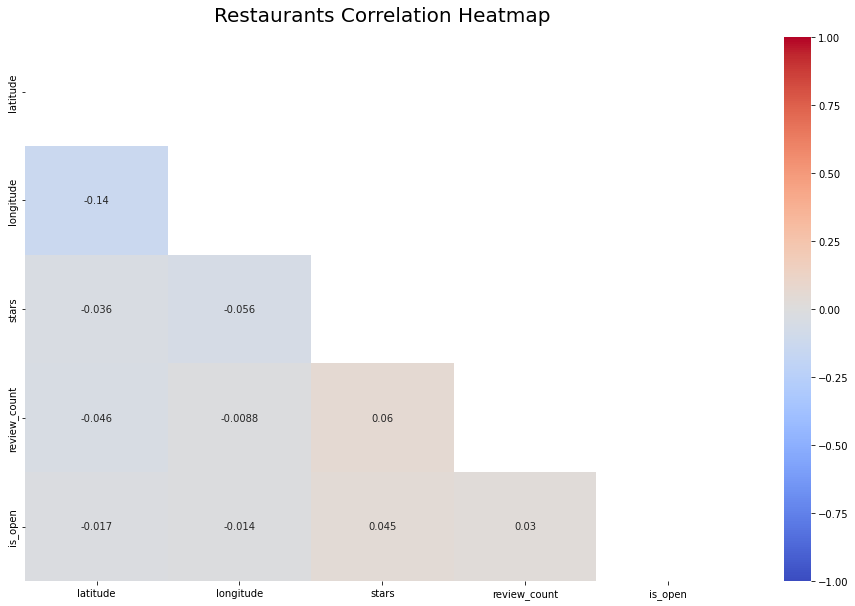

In [25]:
import warnings
warnings.filterwarnings("ignore")

corr = business_df

plt.figure(figsize=(16, 10))
# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(corr.corr(), dtype=np.bool))
heatmap = sns.heatmap(corr.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='coolwarm')
heatmap.set_title('Restaurants Correlation Heatmap', fontdict={'fontsize':20}, pad=16)
# sns.set(font_scale=2);

#### From our EDA, we have decided to subset the dataset to include only restaurants (the most frequent category). We also use is_open column to remove closed businesses from our subset.

In [26]:
## Subsetting data to include data with restaurants and that are open.
## Source: https://www.kaggle.com/code/virajkadam/yelp-restaurants-eda-and-data-preparation

# finding restaurants businesses
business_df['restaurant']= (business_df.categories.str.contains(pat='Restaurant', flags=re.IGNORECASE, regex=True))
# business_df.loc[business_df.restaurant==True]

required_columns = ['business_id','business_name', 'city', 'state', 'postal_code', 'stars', 'categories', 'review_count', 'attributes']  # columns to use 

# filtering open restaurants:
restaurants = business_df[(business_df.restaurant==1) & (business_df.is_open==1)].reset_index(drop=True)

# keeping required cols 
restaurants=restaurants.loc[:,required_columns]

restaurant_list = restaurants.business_id.unique()   # list of restaurants ids 

print(f'There are {len(restaurants):,} Restaurants(That are Open) in the Dataset')

There are 35,004 Restaurants(That are Open) in the Dataset


In [27]:
# Show map where restaurants are located: (!!! This can run slowly, skip if you cannot wait!!!)
from folium.plugins import HeatMap,MarkerCluster

m1=folium.Map(location = (37,-95),
              max_zoom=12,min_zoom=4,zoom_start=6,
              tiles='open street map')

locations = business_df.loc[business_df.restaurant==1,['latitude','longitude']]
cluster = MarkerCluster(locations=locations,
                       ).add_to(m1)
    
m1

From the map, PA and FL are still the two states with the most number of restaurant businesses. We choose to include only those in these two states.

In [28]:
# Filter restaurants in PA & FL
restaurants_reduced_DF = restaurants[(restaurants['state'] == 'PA') | (restaurants['state'] == 'FL')].reset_index(drop=True)
restaurants_reduced_DF

,business_id,business_name,city,state,postal_code,stars,categories,review_count,attributes
0,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,Philadelphia,PA,19107,4.0,"Restaurants, Food, Bubble Tea, Coffee & Tea, B...",80,"{'RestaurantsDelivery': 'False', 'OutdoorSeati..."
1,eEOYSgkmpB90uNA7lDOMRA,Vietnamese Food Truck,Tampa Bay,FL,33602,4.0,"Vietnamese, Food, Restaurants, Food Trucks",10,"{'Alcohol': ''none'', 'OutdoorSeating': 'None'..."
2,MUTTqe8uqyMdBl186RmNeA,Tuna Bar,Philadelphia,PA,19106,4.0,"Sushi Bars, Restaurants, Japanese",245,"{'RestaurantsReservations': 'True', 'Restauran..."
3,ROeacJQwBeh05Rqg7F6TCg,BAP,Philadelphia,PA,19147,4.5,"Korean, Restaurants",205,"{'NoiseLevel': 'u'quiet'', 'GoodForMeal': '{'d..."
4,kV_Q1oqis8Qli8dUoGpTyQ,Ardmore Pizza,Ardmore,PA,19003,3.5,"Pizza, Restaurants",109,"{'RestaurantsGoodForGroups': 'True', 'WiFi': '..."
...,...,...,...,...,...,...,...,...,...
13988,esBGrrmuZzSiECyRBoKvvA,Colony Grill - St. Petersburg,St. Petersburg,FL,33701,4.5,"Bars, Beer Bar, Nightlife, Wine Bars, Pizza, R...",38,"{'RestaurantsPriceRange2': '2', 'RestaurantsAt..."
13989,Wko0HNelt55ZIp3Dm3eD2g,Swiss Farms Store,Springfield,PA,19064,3.5,"Convenience Stores, Sandwiches, Restaurants, F...",5,"{'RestaurantsPriceRange2': '2', 'BusinessAccep..."
13990,wVxXRFf10zTTAs11nr4xeA,PrimoHoagies,Philadelphia,PA,19128,3.0,"Restaurants, Specialty Food, Food, Sandwiches,...",55,"{'NoiseLevel': 'u'average'', 'RestaurantsTakeO..."
13991,l9eLGG9ZKpLJzboZq-9LRQ,Wawa,Clifton Heights,PA,19018,3.0,"Restaurants, Sandwiches, Convenience Stores, C...",11,"{'BikeParking': 'True', 'BusinessAcceptsCredit..."


#### Save DFs as csv files

In [29]:
# saving DF as csv
restaurants.to_csv('restaurants.csv',index=False)
restaurants_reduced_DF.to_csv('restaurants_reduced.csv',index=False)

### [Alternative Method] Processing data using JSON objects (for a faster speed)

Run this part if you would like to obtain JSON data files for later processing steps

In [30]:
# write csv to json
with open('restaurants.csv') as f:
    reader = csv.DictReader(f)
    rows = list(reader)

with open('restaurants.json', 'w') as f: 
    json.dump(rows, f)

In [31]:
def ReadJSONitems(file_name, within_list=False):
    items = []
    with open(file_name, encoding='utf8') as read_file:
        if not within_list:
            for row in read_file:
                items.append(json.loads(row))
        else:
            items = json.load(read_file)
    return items
        
def PropFilter(items, prop, approved_values):
    new_list = []
    for item in items:
        if item[prop] in approved_values:
            new_list.append(item)
    return new_list

def GetPropList(items, prop):
    return [item[prop] for item in items]

Try with original data file to make sure functions work

In [32]:
businesses = ReadJSONitems('yelp_academic_dataset_business.json') #try read original file
businesses

[{'business_id': 'Pns2l4eNsfO8kk83dixA6A',
  'name': 'Abby Rappoport, LAC, CMQ',
  'address': '1616 Chapala St, Ste 2',
  'city': 'Santa Barbara',
  'state': 'CA',
  'postal_code': '93101',
  'latitude': 34.4266787,
  'longitude': -119.7111968,
  'stars': 5.0,
  'review_count': 7,
  'is_open': 0,
  'attributes': {'ByAppointmentOnly': 'True'},
  'categories': 'Doctors, Traditional Chinese Medicine, Naturopathic/Holistic, Acupuncture, Health & Medical, Nutritionists',
  'hours': None},
 {'business_id': 'mpf3x-BjTdTEA3yCZrAYPw',
  'name': 'The UPS Store',
  'address': '87 Grasso Plaza Shopping Center',
  'city': 'Affton',
  'state': 'MO',
  'postal_code': '63123',
  'latitude': 38.551126,
  'longitude': -90.335695,
  'stars': 3.0,
  'review_count': 15,
  'is_open': 1,
  'attributes': {'BusinessAcceptsCreditCards': 'True'},
  'categories': 'Shipping Centers, Local Services, Notaries, Mailbox Centers, Printing Services',
  'hours': {'Monday': '0:0-0:0',
   'Tuesday': '8:0-18:30',
   'Wednes

In [33]:
len(businesses) # check to make sure the same as DF

150346

In [34]:
reduced_businesses = PropFilter(businesses, 'state', ['PA', 'FL']) # business in PA and FL - check to make sure function works
reduced_businesses # type: list of dictionaries

[{'business_id': 'MTSW4McQd7CbVtyjqoe9mw',
  'name': 'St Honore Pastries',
  'address': '935 Race St',
  'city': 'Philadelphia',
  'state': 'PA',
  'postal_code': '19107',
  'latitude': 39.9555052,
  'longitude': -75.1555641,
  'stars': 4.0,
  'review_count': 80,
  'is_open': 1,
  'attributes': {'RestaurantsDelivery': 'False',
   'OutdoorSeating': 'False',
   'BusinessAcceptsCreditCards': 'False',
   'BusinessParking': "{'garage': False, 'street': True, 'validated': False, 'lot': False, 'valet': False}",
   'BikeParking': 'True',
   'RestaurantsPriceRange2': '1',
   'RestaurantsTakeOut': 'True',
   'ByAppointmentOnly': 'False',
   'WiFi': "u'free'",
   'Alcohol': "u'none'",
   'Caters': 'True'},
  'categories': 'Restaurants, Food, Bubble Tea, Coffee & Tea, Bakeries',
  'hours': {'Monday': '7:0-20:0',
   'Tuesday': '7:0-20:0',
   'Wednesday': '7:0-20:0',
   'Thursday': '7:0-20:0',
   'Friday': '7:0-21:0',
   'Saturday': '7:0-21:0',
   'Sunday': '7:0-21:0'}},
 {'business_id': 'mWMc6_wTdE

In [35]:
restaurants_open = ReadJSONitems('restaurants.json') #read restaurants
restaurants_open # type: list of dictionaries within a list

[[{'business_id': 'MTSW4McQd7CbVtyjqoe9mw',
   'business_name': 'St Honore Pastries',
   'city': 'Philadelphia',
   'state': 'PA',
   'postal_code': '19107',
   'stars': '4.0',
   'categories': 'Restaurants, Food, Bubble Tea, Coffee & Tea, Bakeries',
   'review_count': '80',
   'attributes': '{\'RestaurantsDelivery\': \'False\', \'OutdoorSeating\': \'False\', \'BusinessAcceptsCreditCards\': \'False\', \'BusinessParking\': "{\'garage\': False, \'street\': True, \'validated\': False, \'lot\': False, \'valet\': False}", \'BikeParking\': \'True\', \'RestaurantsPriceRange2\': \'1\', \'RestaurantsTakeOut\': \'True\', \'ByAppointmentOnly\': \'False\', \'WiFi\': "u\'free\'", \'Alcohol\': "u\'none\'", \'Caters\': \'True\'}'},
  {'business_id': 'CF33F8-E6oudUQ46HnavjQ',
   'business_name': 'Sonic Drive-In',
   'city': 'Ashland City',
   'state': 'TN',
   'postal_code': '37015',
   'stars': '2.0',
   'categories': 'Burgers, Fast Food, Sandwiches, Food, Ice Cream & Frozen Yogurt, Restaurants',
   

In [36]:
restaurants_reduced_list = PropFilter(restaurants_open[0], 'state', ['PA', 'FL'])
restaurants_reduced_list

[{'business_id': 'MTSW4McQd7CbVtyjqoe9mw',
  'business_name': 'St Honore Pastries',
  'city': 'Philadelphia',
  'state': 'PA',
  'postal_code': '19107',
  'stars': '4.0',
  'categories': 'Restaurants, Food, Bubble Tea, Coffee & Tea, Bakeries',
  'review_count': '80',
  'attributes': '{\'RestaurantsDelivery\': \'False\', \'OutdoorSeating\': \'False\', \'BusinessAcceptsCreditCards\': \'False\', \'BusinessParking\': "{\'garage\': False, \'street\': True, \'validated\': False, \'lot\': False, \'valet\': False}", \'BikeParking\': \'True\', \'RestaurantsPriceRange2\': \'1\', \'RestaurantsTakeOut\': \'True\', \'ByAppointmentOnly\': \'False\', \'WiFi\': "u\'free\'", \'Alcohol\': "u\'none\'", \'Caters\': \'True\'}'},
 {'business_id': 'eEOYSgkmpB90uNA7lDOMRA',
  'business_name': 'Vietnamese Food Truck',
  'city': 'Tampa Bay',
  'state': 'FL',
  'postal_code': '33602',
  'stars': '4.0',
  'categories': 'Vietnamese, Food, Restaurants, Food Trucks',
  'review_count': '10',
  'attributes': '{\'Alcoh

In [37]:
len(restaurants_reduced_list) #check number of open restaurants - same as DF

13993

In [38]:
def WriteJSON(file_name, data):
    with open(file_name, "w") as out_file:
        json.dump(data, out_file)

WriteJSON('restaurants_reduced.json', restaurants_reduced_list)